<a href="https://colab.research.google.com/github/kellerflint/IoT-Final-Project/blob/angelb/Spectrogram_Model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
subject_df = pd.read_csv('/content/drive/MyDrive/Data/subject_info.csv')
subject_df.head()

,Subject Number,Asthma
0,1,N
1,2,Y
2,3,N
3,4,N
4,5,N


In [ ]:
# prompt: Using dataframe subject_df: change Asthma (Y/N) name to Asthma

subject_df.rename(columns={"Asthma (Y/N)": "Asthma"}, inplace=True)
subject_df.head()


,Subject Number,Asthma
0,1,N
1,2,Y
2,3,N
3,4,N
4,5,N


In [ ]:
import os
import glob
import pandas as pd
import numpy as np
from scipy import stats
from sklearn.preprocessing import StandardScaler

def remove_outliers(df, columns):
    z_scores = np.abs(stats.zscore(df[columns]))
    filtered_entries = (z_scores < 4).all(axis=1)  # Relaxing the threshold to 4
    return df[filtered_entries]

def standardize(df, columns):
    scaler = StandardScaler()
    df.loc[:, columns] = scaler.fit_transform(df[columns])
    return df

# Original file pattern
file_pattern = '/content/drive/MyDrive/Data/ProcessedData_Subject*.csv'

# List of files that match the pattern
files = glob.glob(file_pattern)

# New directory where the processed files will be saved
new_directory = r"/content/drive/MyDrive/Data/StandardData"

# Explicitly define columns to process
columns_to_process = ['Time [s]', 'Pressure [cmH2O]', 'Flow [L/s]', 'V_tidal [L]']

for filepath in files:
    # Read the CSV file, including only the specified columns
    df = pd.read_csv(filepath, usecols=columns_to_process)

    # Fill missing values with forward fill
    df.ffill(inplace=True)

    # Remove 'Time [s]' from the list for processing steps like outlier removal and standardization
    process_columns = [col for col in columns_to_process if col != 'Time [s]']

    df_clean = remove_outliers(df, process_columns)

    # Check if df_clean is empty
    if not df_clean.empty:
        df_standardized = standardize(df_clean, process_columns)

        # Define the new filename based on the original filename
        original_filename = os.path.basename(filepath)
        new_filename = original_filename.replace('ProcessedData_', 'ProcessedStandardizedData_')

        # Construct the new file path
        new_filepath = os.path.join(new_directory, new_filename)

        # Save the processed file to the new directory
        df_standardized.to_csv(new_filepath, index=False)
        print(f'Processed and saved: {new_filepath}')
    else:
        print(f'No data left after outlier removal in file: {filepath}. Skipping standardization and saving.')


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject01.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject04.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject02.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject06.csv
Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject08.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject05.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject03.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject07.csv
Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject12.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject15.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject10.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject14.csv
Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject13.csv
Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject11.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject09.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject19.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject20.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject21.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject18.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject22.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject16.csv
Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject17.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject24.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject28.csv
Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject26.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject25.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject23.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject29.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject27.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject34.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject36.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject35.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject32.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject30.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject33.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject31.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject40.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject42.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject41.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject38.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject37.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject39.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject47.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject50.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject44.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject45.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject46.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject49.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject43.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject48.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject55.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject51.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject52.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject53.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject54.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject56.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject60.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject59.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject58.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject57.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject61.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject62.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject67.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject63.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject66.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject64.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject68.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject65.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject69.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject73.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject76.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject74.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject72.csv
Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject71.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject75.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject70.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject78.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject77.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject80.csv


<ipython-input-4-339c6e82d97e>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[:, columns] = scaler.fit_transform(df[columns])


Processed and saved: /content/drive/MyDrive/Data/StandardData/ProcessedStandardizedData_Subject79.csv


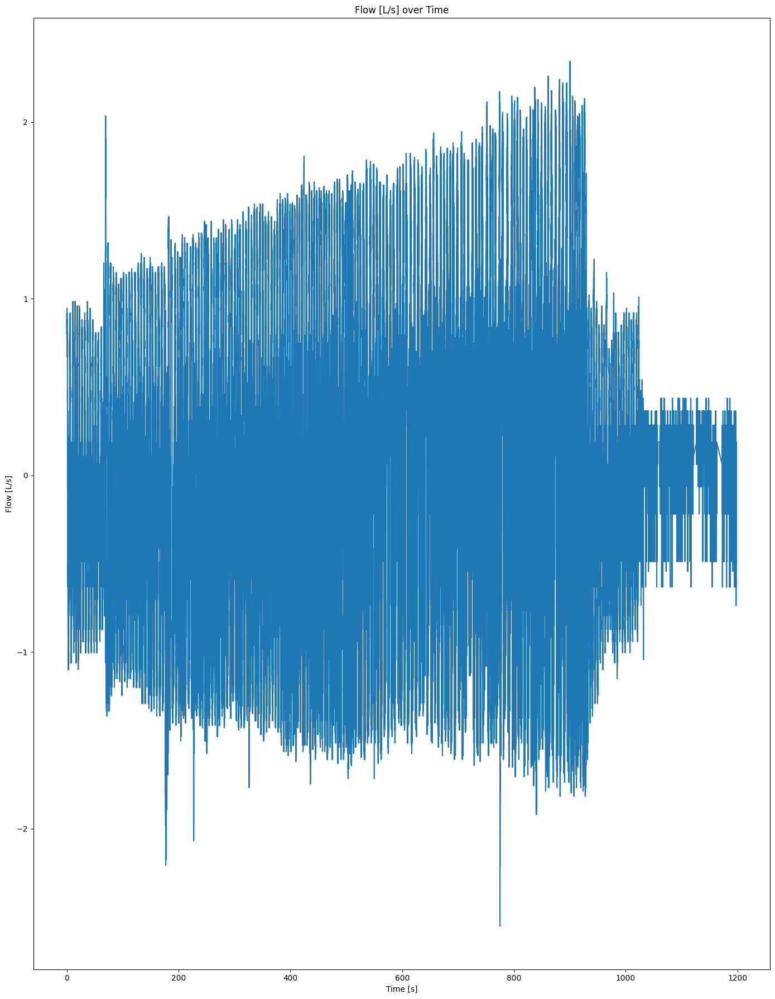

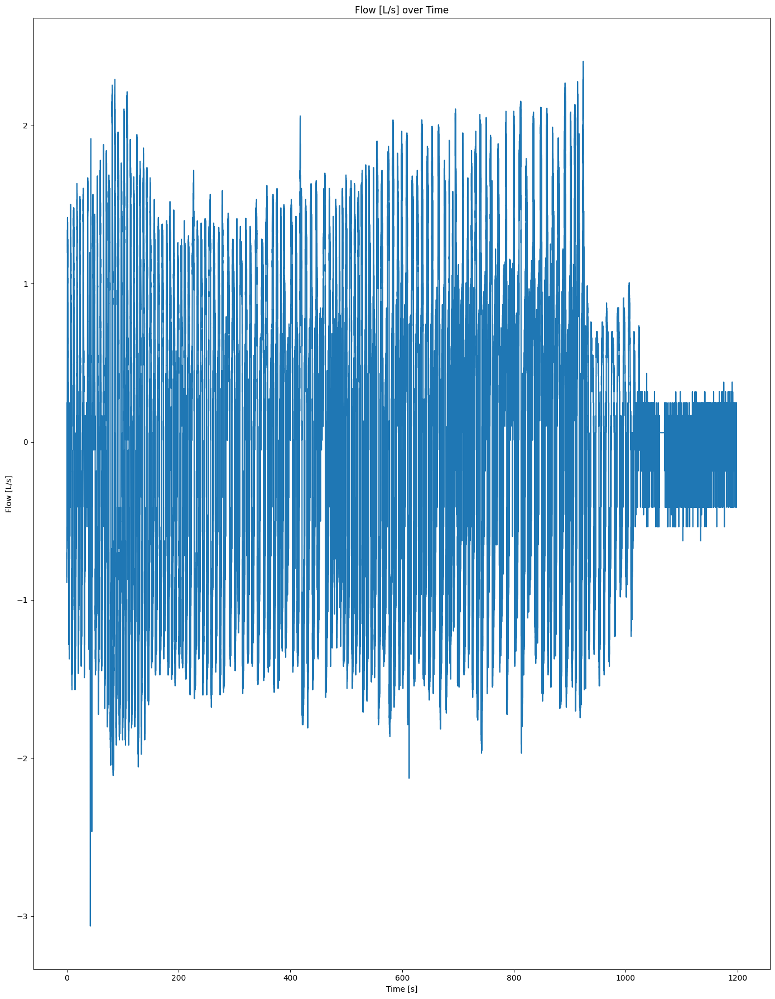

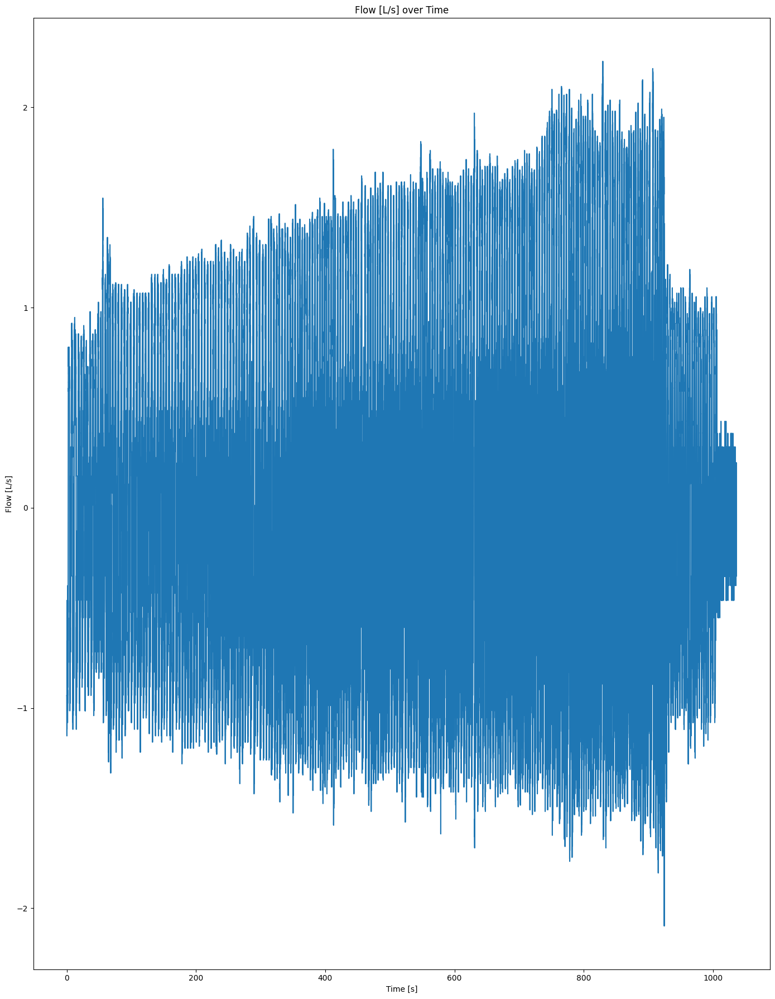

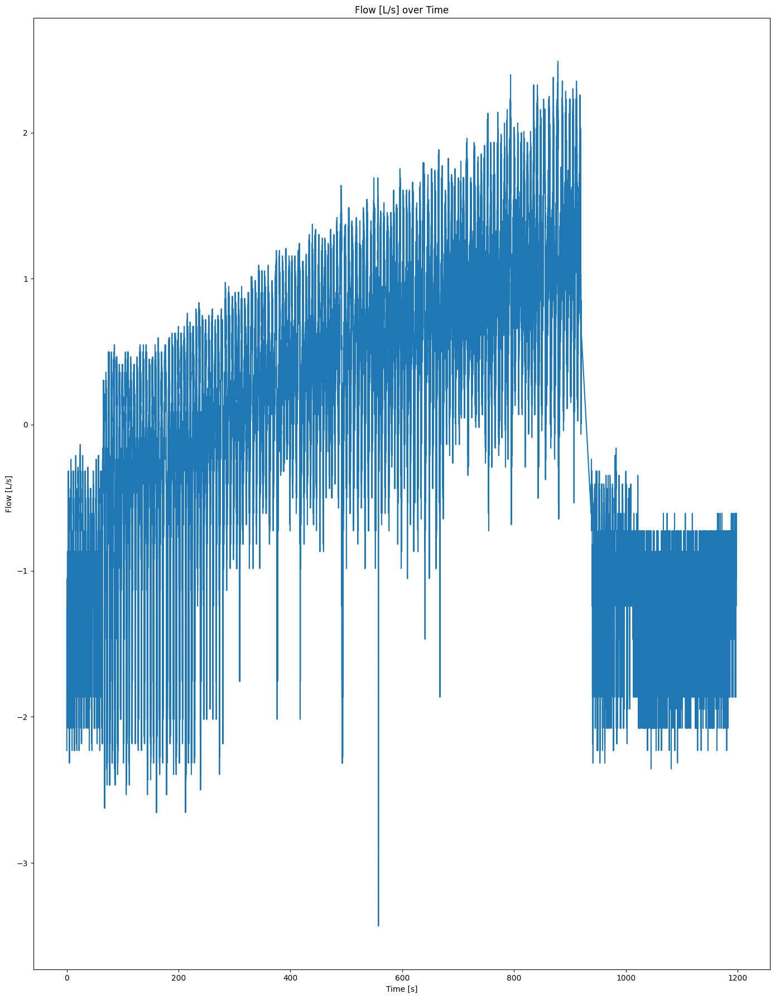

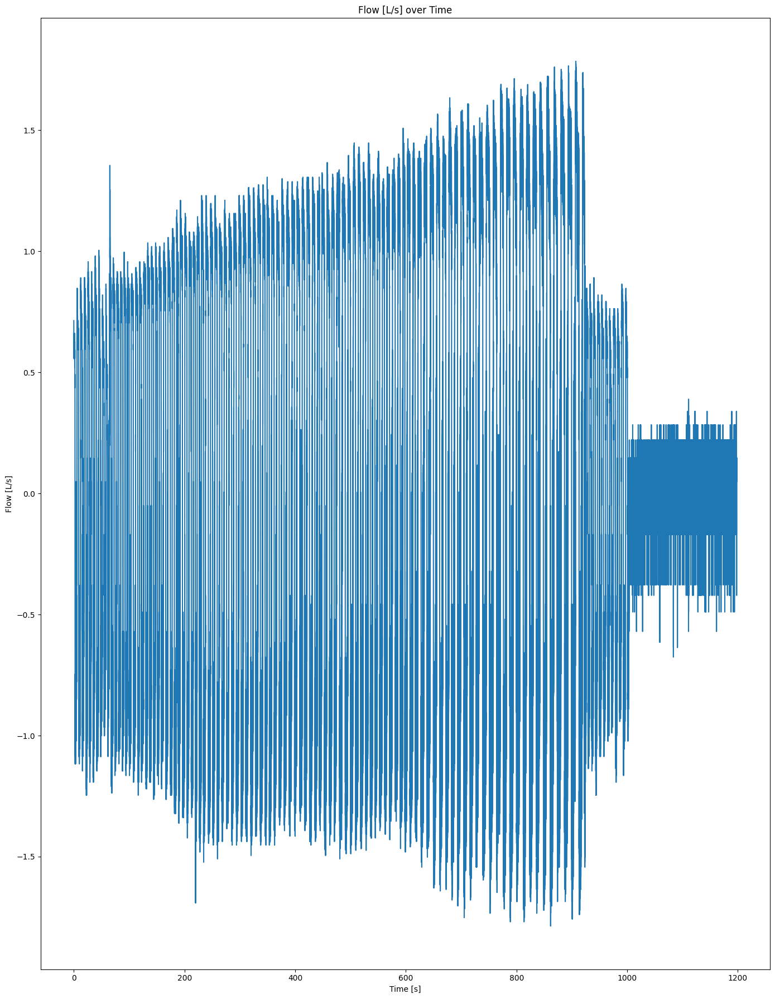

...

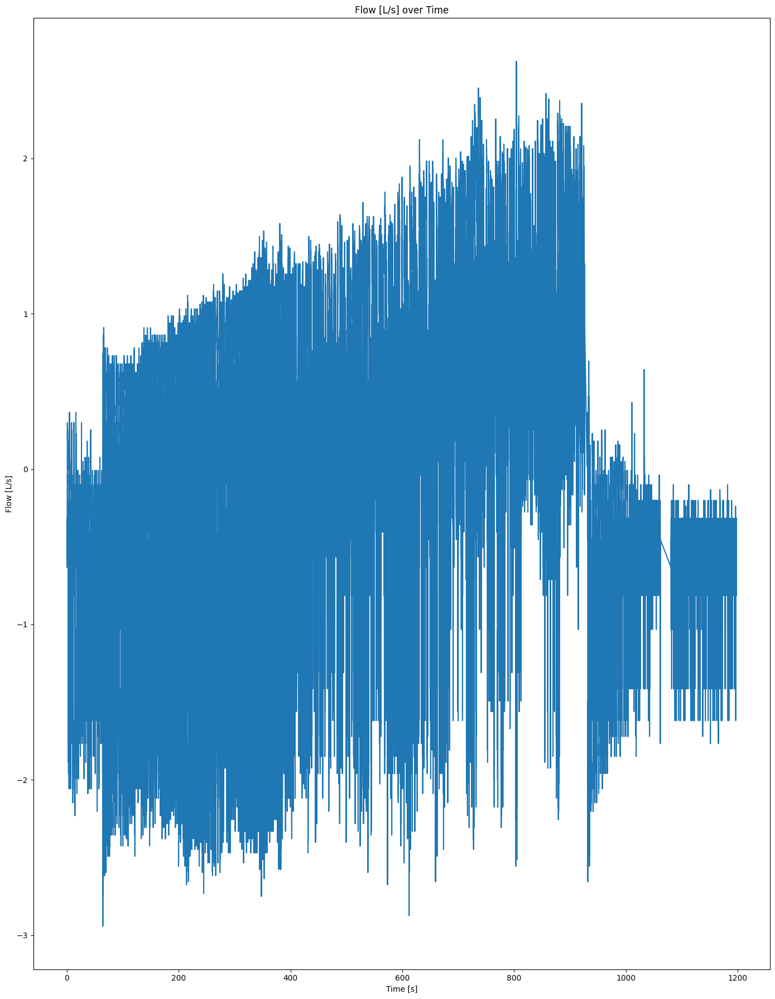

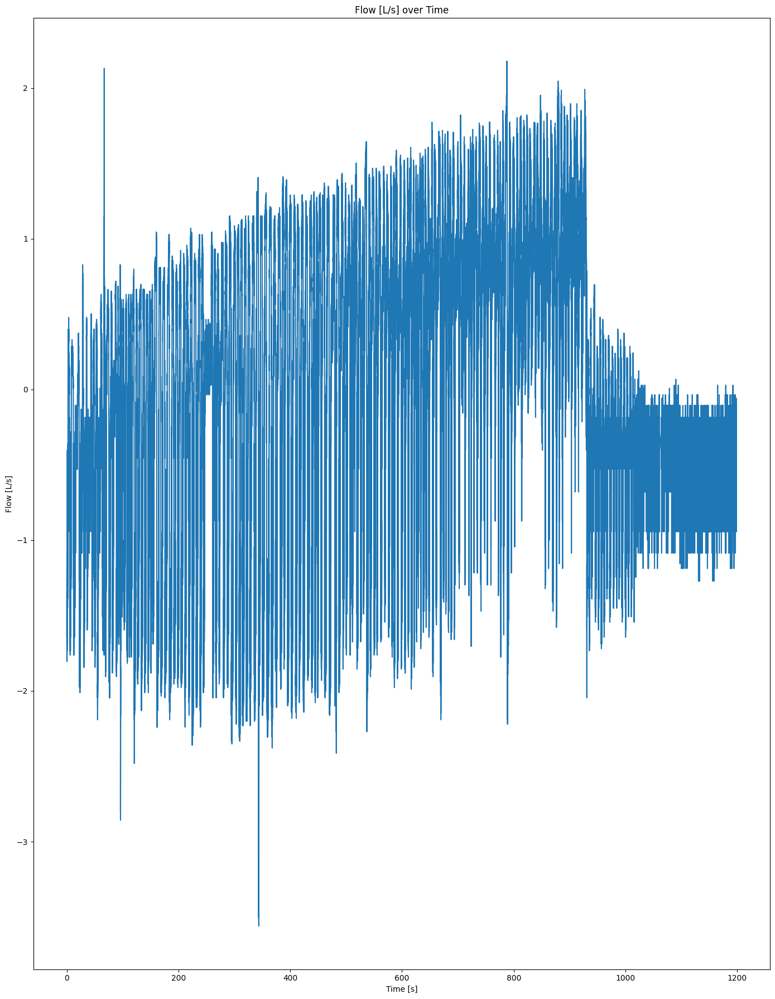

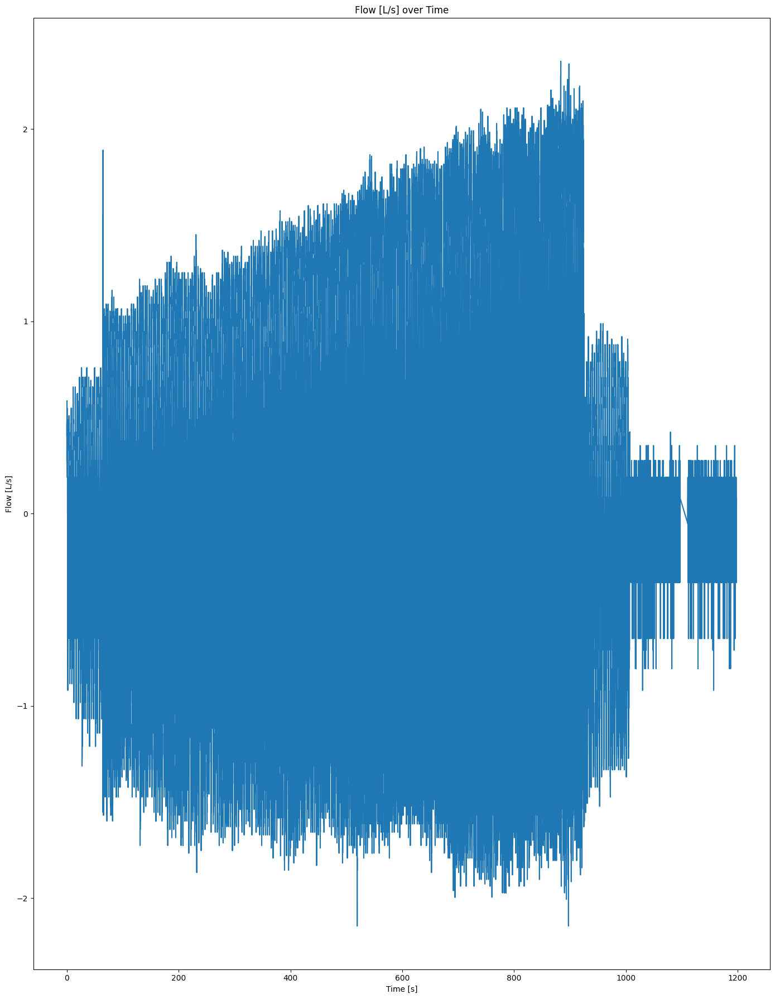

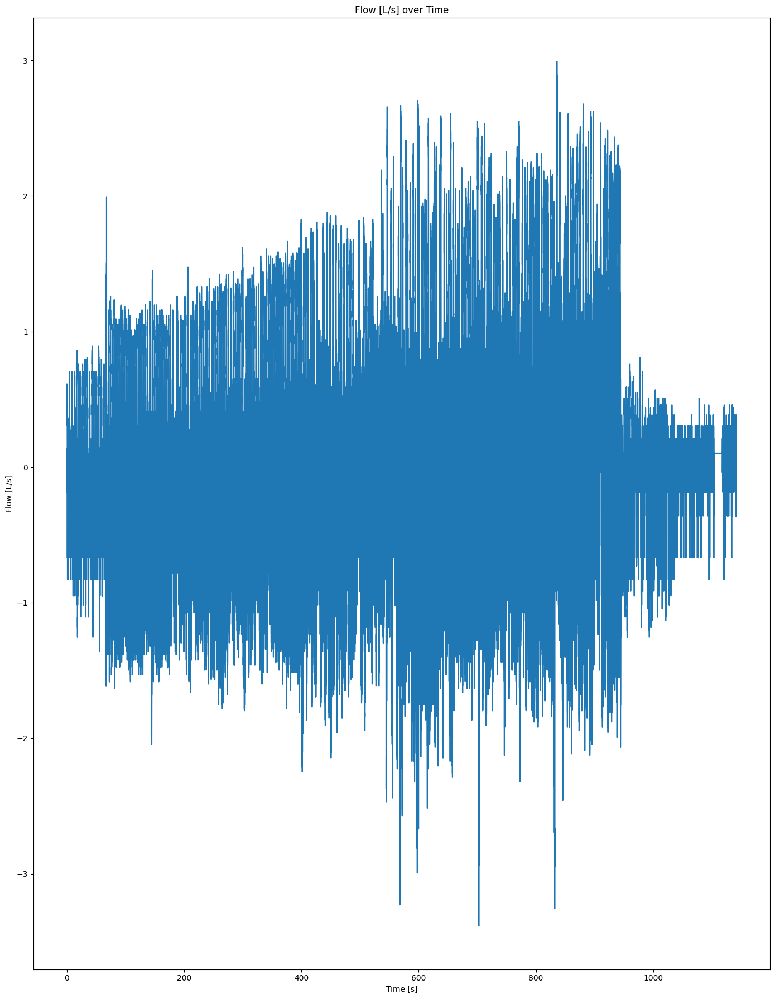

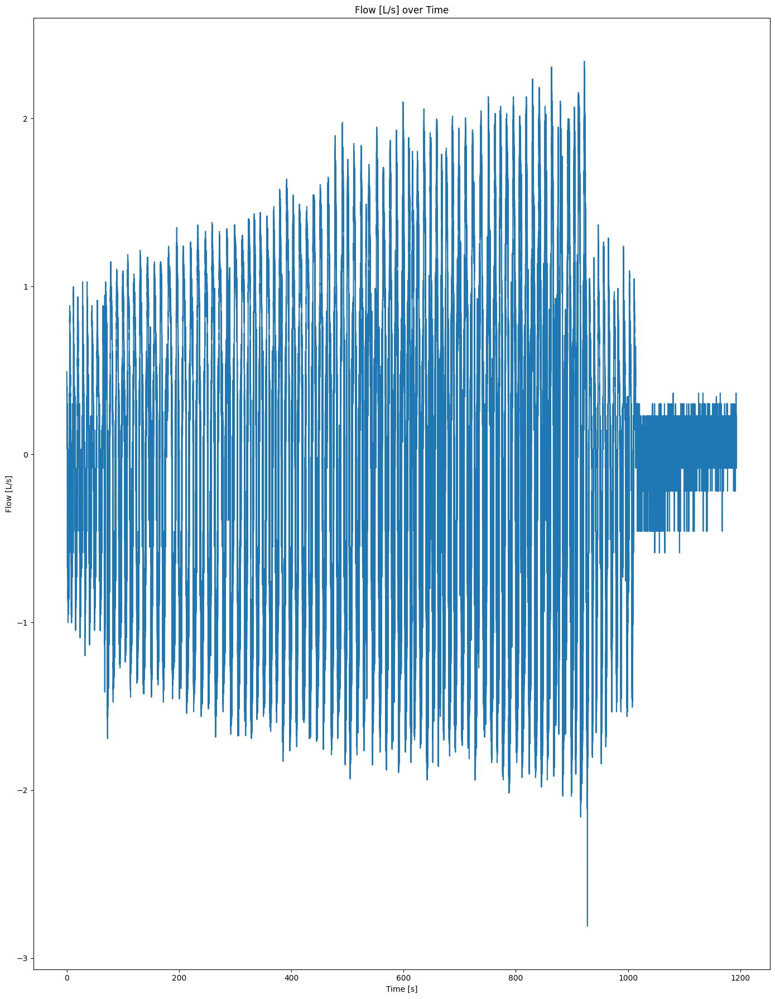

In [ ]:
import glob
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import os

# Absolute directory path to match the standardized data files
directory_path = "/content/drive/MyDrive/Data/StandardData"
# Adjust the file pattern, ensuring it matches the files you want to process
file_pattern = os.path.join(directory_path, 'ProcessedStandardizedData_Subject*.csv')
files = glob.glob(file_pattern)

# List of variables to plot
variables_to_plot = [
    'Flow [L/s]',
]

for filepath in files:
    # Read the CSV file
    df = pd.read_csv(filepath)

    # Check and convert 'Time [s]' to seconds for plotting if it exists
    if 'Time [s]' in df.columns:
        df['Time [s]'] = pd.to_timedelta(df['Time [s]'], unit='s').dt.total_seconds()
        time_column = 'Time [s]'
    else:
        time_columns = [col for col in df.columns if 'Time' in col]
        if time_columns:
            time_column = time_columns[0]  # Use the first alternative time column found
            df[time_column] = pd.to_timedelta(df[time_column], unit='s').dt.total_seconds()
        else:
            print(f"No suitable 'Time' column found in {filepath}. Skipping this file.")
            continue  # Skip the rest of the loop for this file

    # Set the figure size and the layout for subplots
    plt.figure(figsize=(14, 18))

    # Create subplots for each variable
    for i, variable in enumerate(variables_to_plot, start=1):
        if variable in df.columns:
            ax = plt.subplot(len(variables_to_plot), 1, i)
            ax.plot(df[time_column], df[variable])
            ax.set_title(f'{variable} over Time')
            ax.set_xlabel('Time [s]')
            ax.set_ylabel(variable)

            # Use a Linear scale and format the x-axis to show non-scientific notation
            ax.ticklabel_format(style='plain', axis='x')
            ax.xaxis.set_major_formatter(ticker.ScalarFormatter(useOffset=False))
            ax.xaxis.get_major_formatter().set_scientific(False)
        else:
            print(f"The column {variable} is not present in the file {filepath}.")

    # Adjust the layout so that all plots fit well
    plt.tight_layout()

    # Display the plots
    plt.show()


In [ ]:
import glob
import pandas as pd
import matplotlib.pyplot as plt
from scipy.signal import spectrogram
import os

# Directory paths
directory_path = r"/content/drive/MyDrive/Data/StandardData"
output_directory = r"/content/drive/MyDrive/Data/SpectrogramFiles"

# Ensure output directory exists
if not os.path.exists(output_directory):
    os.makedirs(output_directory)
    print(f"Created directory: {output_directory}")
else:
    print(f"Directory already exists: {output_directory}")

# Variables and time frame
variables_to_plot = ['Flow [L/s]',]
time_start, time_stop = 60, 120

# Process each CSV file
for filepath in glob.glob(os.path.join(directory_path, 'ProcessedStandardizedData_Subject*.csv')):
    df = pd.read_csv(filepath)
    df['Time [s]'] = pd.to_timedelta(df['Time [s]'], unit='s').dt.total_seconds()
    filtered_df = df[(df['Time [s]'] >= time_start) & (df['Time [s]'] <= time_stop)]
    filtered_df = filtered_df[variables_to_plot + ['Time [s]']].copy()

    for variable in variables_to_plot:
        if variable in filtered_df.columns:
            # Spectrogram generation
            f, t, Sxx = spectrogram(filtered_df[variable], fs=100)
            plt.figure(figsize=(14, 4))
            plt.pcolormesh(t, f, 10 * np.log10(Sxx), shading='gouraud', cmap='gray')
            plt.ylabel('Frequency [Hz]')
            plt.yscale('log')
            plt.ylim(0.5, 50)
            plt.xlabel('Time [s]')
            plt.title(f'Spectrogram of {variable}')
            output_filename = f"{os.path.splitext(os.path.basename(filepath))[0]}.png"
            output_filepath = os.path.join(output_directory, output_filename)
            plt.savefig(output_filepath)
            plt.close()
            # Convert the saved image to grayscale
            img = plt.imread(output_filepath)
            img_gray = img.mean(axis=2)
            plt.imsave(output_filepath, img_gray, cmap='gray')
            print(f"Spectrogram saved to {output_filepath}")
        else:
            print(f"Column {variable} not in file {filepath}")


Directory already exists: /content/drive/MyDrive/Data/SpectrogramFiles
Spectrogram saved to /content/drive/MyDrive/Data/SpectrogramFiles/ProcessedStandardizedData_Subject01.png
Spectrogram saved to /content/drive/MyDrive/Data/SpectrogramFiles/ProcessedStandardizedData_Subject04.png
Spectrogram saved to /content/drive/MyDrive/Data/SpectrogramFiles/ProcessedStandardizedData_Subject02.png
Spectrogram saved to /content/drive/MyDrive/Data/SpectrogramFiles/ProcessedStandardizedData_Subject06.png
Spectrogram saved to /content/drive/MyDrive/Data/SpectrogramFiles/ProcessedStandardizedData_Subject08.png
Spectrogram saved to /content/drive/MyDrive/Data/SpectrogramFiles/ProcessedStandardizedData_Subject05.png
Spectrogram saved to /content/drive/MyDrive/Data/SpectrogramFiles/ProcessedStandardizedData_Subject03.png
Spectrogram saved to /content/drive/MyDrive/Data/SpectrogramFiles/ProcessedStandardizedData_Subject07.png
Spectrogram saved to /content/drive/MyDrive/Data/SpectrogramFiles/ProcessedStanda

In [ ]:
import glob
import pandas as pd
import matplotlib.pyplot as plt
from scipy.signal import spectrogram
import os
import numpy as np

# Directory paths
directory_path = r"/content/drive/MyDrive/Data/StandardData"
output_directory = r"/content/drive/MyDrive/Data/SpectrogramFiles"

# Ensure output directory exists
if not os.path.exists(output_directory):
    os.makedirs(output_directory)
    print(f"Created directory: {output_directory}")
else:
    print(f"Directory already exists: {output_directory}")

# Load subject info
subject_info_path = r"/content/drive/MyDrive/Data/subject_info.csv"
subject_info_df = pd.read_csv(subject_info_path)

# Initialize metadata list
metadata = []

# Process each CSV file
for filepath in glob.glob(os.path.join(directory_path, 'ProcessedStandardizedData_Subject*.csv')):
    df = pd.read_csv(filepath)
    df['Time [s]'] = pd.to_timedelta(df['Time [s]'], unit='s').dt.total_seconds()
    filtered_df = df[(df['Time [s]'] >= time_start) & (df['Time [s]'] <= time_stop)]
    filtered_df = filtered_df[variables_to_plot + ['Time [s]']].copy()

    for variable in variables_to_plot:
        if variable in filtered_df.columns:
            # Spectrogram generation
            f, t, Sxx = spectrogram(filtered_df[variable], fs=100)
            plt.figure(figsize=(14, 4))
            plt.pcolormesh(t, f, 10 * np.log10(Sxx), shading='gouraud', cmap='gray')
            plt.ylabel('Frequency [Hz]')
            plt.yscale('log')
            plt.ylim(0.5, 50)
            plt.xlabel('Time [s]')
            plt.title(f'Spectrogram of {variable}')

            # File naming and saving
            safe_variable = variable.replace(' ', '_').replace('[', '').replace(']', '').replace('/', '_')
            output_filename = f"{os.path.splitext(os.path.basename(filepath))[0]}.png"
            output_filepath = os.path.join(output_directory, output_filename)
            plt.savefig(output_filepath)
            plt.close()

            # Extract subject number from file name
            subject_number = int(output_filename.split('_')[-1][7:-4])

            # Get Asthma status from subject_info_df
            asthma_status = subject_info_df.loc[subject_info_df['Subject Number'] == subject_number, 'Asthma'].values[0]

            # Update metadata
            metadata.append({
                'original_file': os.path.basename(filepath),
                'spectrogram_file': output_filename,
                'variable': variable,
                'Asthma': asthma_status
            })
            print(f"Spectrogram saved to {output_filepath}")
        else:
            print(f"Column {variable} not in file {filepath}.")

# Save metadata to CSV
metadata_df = pd.DataFrame(metadata)
metadata_csv_path = os.path.join(output_directory, 'spectrogram_metadata.csv')
metadata_df.to_csv(metadata_csv_path, index=False)
print(f"Metadata saved to {metadata_csv_path}")


Directory already exists: /content/drive/MyDrive/Data/SpectrogramFiles
Spectrogram saved to /content/drive/MyDrive/Data/SpectrogramFiles/ProcessedStandardizedData_Subject01.png
Spectrogram saved to /content/drive/MyDrive/Data/SpectrogramFiles/ProcessedStandardizedData_Subject04.png
Spectrogram saved to /content/drive/MyDrive/Data/SpectrogramFiles/ProcessedStandardizedData_Subject02.png
Spectrogram saved to /content/drive/MyDrive/Data/SpectrogramFiles/ProcessedStandardizedData_Subject06.png
Spectrogram saved to /content/drive/MyDrive/Data/SpectrogramFiles/ProcessedStandardizedData_Subject08.png
Spectrogram saved to /content/drive/MyDrive/Data/SpectrogramFiles/ProcessedStandardizedData_Subject05.png
Spectrogram saved to /content/drive/MyDrive/Data/SpectrogramFiles/ProcessedStandardizedData_Subject03.png
Spectrogram saved to /content/drive/MyDrive/Data/SpectrogramFiles/ProcessedStandardizedData_Subject07.png
Spectrogram saved to /content/drive/MyDrive/Data/SpectrogramFiles/ProcessedStanda

In [ ]:
import os
import glob
import pandas as pd

# Load subject info
subject_info_path = '/content/drive/MyDrive/Data/subject_info.csv'
subject_info_df = pd.read_csv(subject_info_path)

# Directory paths
output_directory = '/content/drive/MyDrive/Data/SpectrogramFiles'

# Load metadata
metadata_csv_path = os.path.join(output_directory, 'spectrogram_metadata.csv')
metadata_df = pd.read_csv(metadata_csv_path)

# Extract subject number from file name and convert to int
metadata_df['Subject Number'] = metadata_df['original_file'].str.extract(r'(\d+)').astype(int)

# Merge metadata with subject info
merged_df = pd.merge(metadata_df, subject_info_df, on='Subject Number', how='left')

# Save updated metadata to CSV
updated_metadata_csv_path = os.path.join(output_directory, 'updated_spectrogram_metadata.csv')
merged_df.to_csv(updated_metadata_csv_path, index=False)

print(f"Updated metadata saved to {updated_metadata_csv_path}")


Updated metadata saved to /content/drive/MyDrive/Data/SpectrogramFiles/updated_spectrogram_metadata.csv


In [ ]:
merged_df.head()

,original_file,spectrogram_file,variable,Asthma_x,Subject Number,Asthma_y
0,ProcessedStandardizedData_Subject01.csv,ProcessedStandardizedData_Subject01.png,Flow [L/s],N,1,N
1,ProcessedStandardizedData_Subject04.csv,ProcessedStandardizedData_Subject04.png,Flow [L/s],N,4,N
2,ProcessedStandardizedData_Subject02.csv,ProcessedStandardizedData_Subject02.png,Flow [L/s],Y,2,Y
3,ProcessedStandardizedData_Subject06.csv,ProcessedStandardizedData_Subject06.png,Flow [L/s],N,6,N
4,ProcessedStandardizedData_Subject08.csv,ProcessedStandardizedData_Subject08.png,Flow [L/s],N,8,N


In [ ]:
# Drop Asthma_y column
merged_df.drop(columns=['Asthma_y'], inplace=True)
merged_df.head()

,original_file,spectrogram_file,variable,Asthma_x,Subject Number
0,ProcessedStandardizedData_Subject01.csv,ProcessedStandardizedData_Subject01.png,Flow [L/s],N,1
1,ProcessedStandardizedData_Subject04.csv,ProcessedStandardizedData_Subject04.png,Flow [L/s],N,4
2,ProcessedStandardizedData_Subject02.csv,ProcessedStandardizedData_Subject02.png,Flow [L/s],Y,2
3,ProcessedStandardizedData_Subject06.csv,ProcessedStandardizedData_Subject06.png,Flow [L/s],N,6
4,ProcessedStandardizedData_Subject08.csv,ProcessedStandardizedData_Subject08.png,Flow [L/s],N,8


In [ ]:
# Rename Asthma_x to Asthma
merged_df.rename(columns={'Asthma_x': 'Asthma'}, inplace=True)

# Organize in increasing order of Subject Number
merged_df.sort_values(by='Subject Number', inplace=True)

# One-hot encode Asthma
merged_df = pd.get_dummies(merged_df, columns=['Asthma'], drop_first=True)

# Display the updated DataFrame
merged_df.head()


,original_file,spectrogram_file,variable,Subject Number,Asthma_Y
0,ProcessedStandardizedData_Subject01.csv,ProcessedStandardizedData_Subject01.png,Flow [L/s],1,0
2,ProcessedStandardizedData_Subject02.csv,ProcessedStandardizedData_Subject02.png,Flow [L/s],2,1
6,ProcessedStandardizedData_Subject03.csv,ProcessedStandardizedData_Subject03.png,Flow [L/s],3,0
1,ProcessedStandardizedData_Subject04.csv,ProcessedStandardizedData_Subject04.png,Flow [L/s],4,0
5,ProcessedStandardizedData_Subject05.csv,ProcessedStandardizedData_Subject05.png,Flow [L/s],5,0


In [ ]:
merged_df.rename(columns={'Asthma_Y': 'Asthma'}, inplace=True)
merged_df.head()

,original_file,spectrogram_file,variable,Subject Number,Asthma
0,ProcessedStandardizedData_Subject01.csv,ProcessedStandardizedData_Subject01.png,Flow [L/s],1,0
2,ProcessedStandardizedData_Subject02.csv,ProcessedStandardizedData_Subject02.png,Flow [L/s],2,1
6,ProcessedStandardizedData_Subject03.csv,ProcessedStandardizedData_Subject03.png,Flow [L/s],3,0
1,ProcessedStandardizedData_Subject04.csv,ProcessedStandardizedData_Subject04.png,Flow [L/s],4,0
5,ProcessedStandardizedData_Subject05.csv,ProcessedStandardizedData_Subject05.png,Flow [L/s],5,0


In [ ]:
import os
import numpy as np
from PIL import Image
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical

# Function to load and preprocess images
def load_images(metadata_df, image_directory):
    images = []
    labels = []

    for index, row in metadata_df.iterrows():
        image_path = os.path.join(image_directory, row['spectrogram_file'])
        label = row['Asthma']

        # Load image
        image = Image.open(image_path)
        image = image.resize((img_width, img_height))  # Resize if needed
        image = np.array(image) / 255.0  # Normalize pixel values

        # Append image and label to lists
        images.append(image)
        labels.append(label)

    return np.array(images), np.array(labels)

# Image dimensions (adjust if needed)
img_width, img_height = 128, 128

# Directory path for spectrogram images
image_directory = '/content/drive/MyDrive/Data/SpectrogramFiles'

# Load images and labels
images, labels = load_images(merged_df, image_directory)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(images, labels, test_size=0.2, random_state=42)

# Convert labels to categorical
y_train = to_categorical(y_train)
y_test = to_categorical(y_test)

# Display shapes
print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)
print("y_train shape:", y_train.shape)
print("y_test shape:", y_test.shape)


X_train shape: (64, 128, 128, 4)
X_test shape: (16, 128, 128, 4)
y_train shape: (64, 2)
y_test shape: (16, 2)


In [ ]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, LSTM, Dense, TimeDistributed

# Define CNN LSTM model
model = Sequential()

# CNN layers
model.add(TimeDistributed(Conv2D(32, (3, 3), activation='relu'), input_shape=(None, img_width, img_height, 4)))
model.add(TimeDistributed(MaxPooling2D((2, 2))))
model.add(TimeDistributed(Conv2D(64, (3, 3), activation='relu')))
model.add(TimeDistributed(MaxPooling2D((2, 2))))
model.add(TimeDistributed(Conv2D(128, (3, 3), activation='relu')))
model.add(TimeDistributed(MaxPooling2D((2, 2))))
model.add(TimeDistributed(Conv2D(128, (3, 3), activation='relu')))
model.add(TimeDistributed(MaxPooling2D((2, 2))))
model.add(TimeDistributed(Flatten()))

# LSTM layer
model.add(LSTM(64, activation='relu'))

# Output layer
model.add(Dense(2, activation='softmax'))

# Compile model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Display model summary
model.summary()


Model: "sequential_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed_22 (TimeD  (None, None, 126, 126,    1184      
 istributed)                 32)                                 
                                                                 
 time_distributed_23 (TimeD  (None, None, 63, 63, 32   0         
 istributed)                 )                                   
                                                                 
 time_distributed_24 (TimeD  (None, None, 61, 61, 64   18496     
 istributed)                 )                                   
                                                                 
 time_distributed_25 (TimeD  (None, None, 30, 30, 64   0         
 istributed)                 )                                   
                                                                 
 time_distributed_26 (TimeD  (None, None, 28, 28, 12 

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import TimeDistributed, Conv2D, MaxPooling2D, LSTM, Dense, Flatten

# Define the model
model = Sequential([
    TimeDistributed(Conv2D(32, (3, 3), activation='relu'), input_shape=(None, 128, 128, 4)),
    TimeDistributed(MaxPooling2D((2, 2))),
    TimeDistributed(Conv2D(64, (3, 3), activation='relu')),
    TimeDistributed(MaxPooling2D((2, 2))),
    TimeDistributed(Conv2D(128, (3, 3), activation='relu')),
    TimeDistributed(MaxPooling2D((2, 2))),
    TimeDistributed(Flatten()),
    LSTM(64),
    Dense(2, activation='softmax')
])

# Compile the model
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

import numpy as np

# Reshape input data to match the expected shape
X_train = np.reshape(X_train, (X_train.shape[0], 1, *X_train.shape[1:]))
X_test = np.reshape(X_test, (X_test.shape[0], 1, *X_test.shape[1:]))

# Train the model
history = model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_test, y_test))

# Evaluate the model
loss, accuracy = model.evaluate(X_test, y_test)
print(f'Test Loss: {loss}, Test Accuracy: {accuracy}')


Epoch 1/10
2/2 [==============================] - 6s 2s/step - loss: 0.7547 - accuracy: 0.5469 - val_loss: 0.7684 - val_accuracy: 0.6250
Epoch 2/10
2/2 [==============================] - 2s 1s/step - loss: 0.6130 - accuracy: 0.7031 - val_loss: 0.6637 - val_accuracy: 0.6250
Epoch 3/10
2/2 [==============================] - 4s 2s/step - loss: 0.6349 - accuracy: 0.7031 - val_loss: 0.6624 - val_accuracy: 0.6250
Epoch 4/10
2/2 [==============================] - 2s 1s/step - loss: 0.6090 - accuracy: 0.7031 - val_loss: 0.6879 - val_accuracy: 0.6250
Epoch 5/10
2/2 [==============================] - 2s 1s/step - loss: 0.6111 - accuracy: 0.7031 - val_loss: 0.6967 - val_accuracy: 0.6250
Epoch 6/10
2/2 [==============================] - 2s 1s/step - loss: 0.6147 - accuracy: 0.7031 - val_loss: 0.6725 - val_accuracy: 0.6250
Epoch 7/10
2/2 [==============================] - 2s 1s/step - loss: 0.6082 - accuracy: 0.7031 - val_loss: 0.6688 - val_accuracy: 0.6250
Epoch 8/10
2/2 [=========================

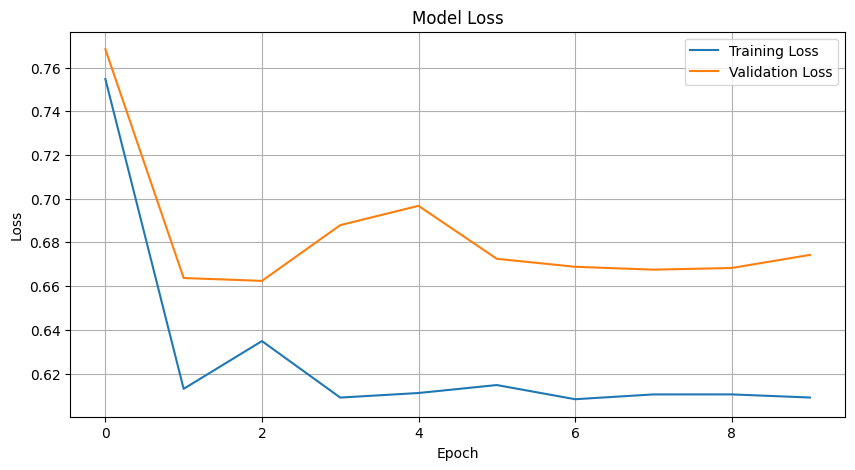

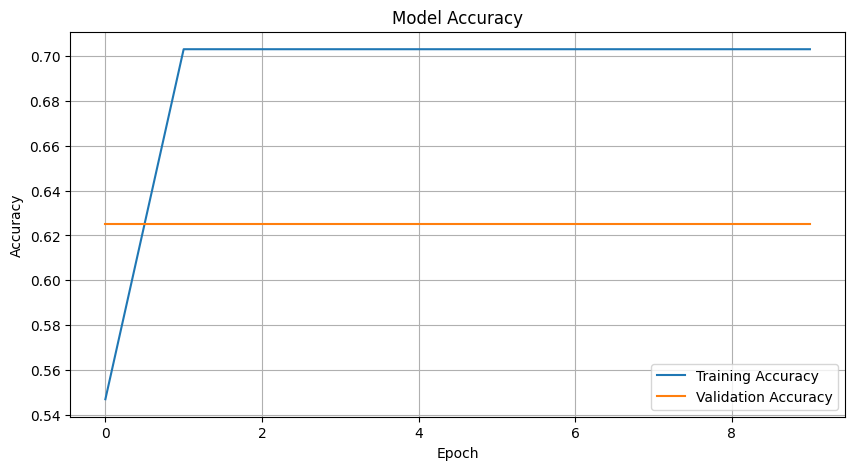

In [ ]:
import matplotlib.pyplot as plt

# Plot training & validation loss values
plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

# Plot training & validation accuracy values
plt.figure(figsize=(10, 5))
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()


1/1 [==============================] - 1s 1s/step


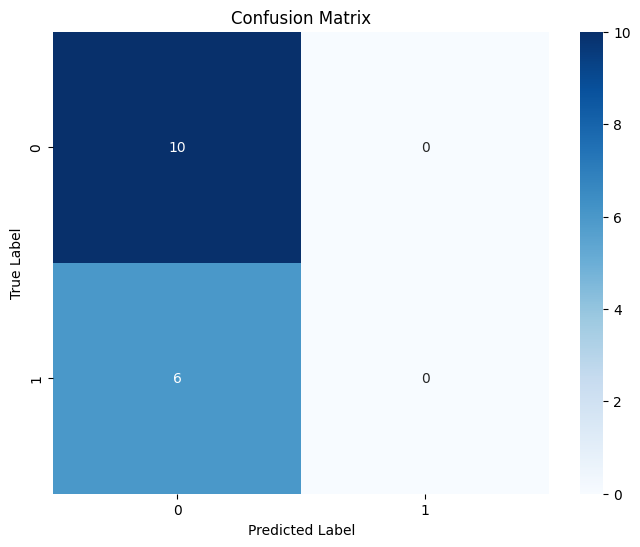

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Predict classes for the test set
y_pred = model.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true_classes = np.argmax(y_test, axis=1)

# Compute confusion matrix
conf_matrix = confusion_matrix(y_true_classes, y_pred_classes)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()


In [ ]:
# Generate predictions for the test set
predictions = model.predict(X_test)


1/1 [==============================] - 0s 188ms/step


In [ ]:
# Get predicted class labels
predicted_labels = np.argmax(predictions, axis=1)


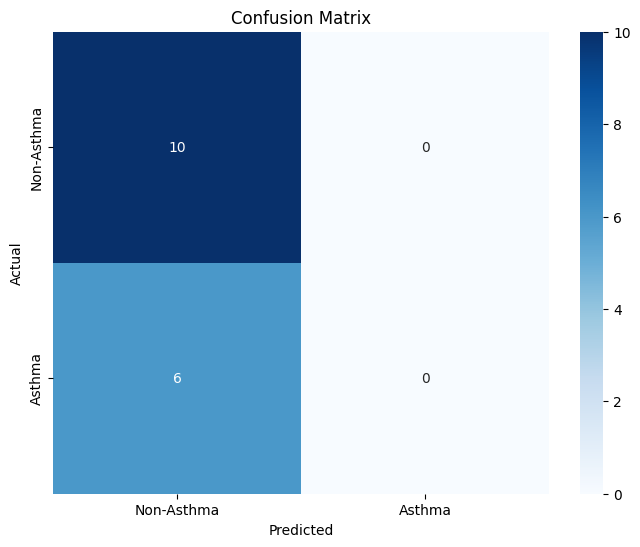

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Calculate confusion matrix
cm = confusion_matrix(np.argmax(y_test, axis=1), predicted_labels)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Non-Asthma', 'Asthma'], yticklabels=['Non-Asthma', 'Asthma'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()


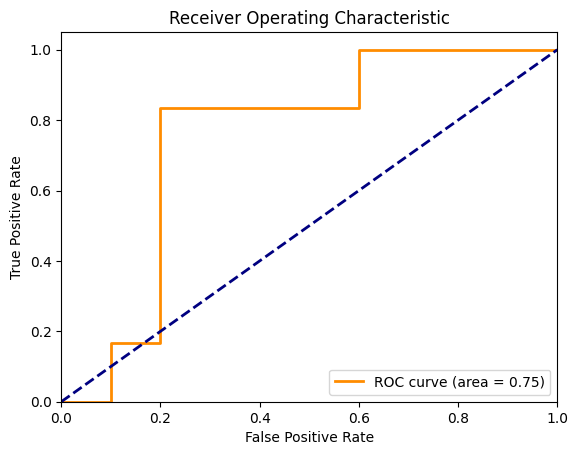

In [ ]:
from sklearn.metrics import roc_curve, auc

# Compute ROC curve and ROC area for each class
fpr, tpr, _ = roc_curve(y_test[:, 1], predictions[:, 1])
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure()
lw = 2
plt.plot(fpr, tpr, color='darkorange', lw=lw, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()


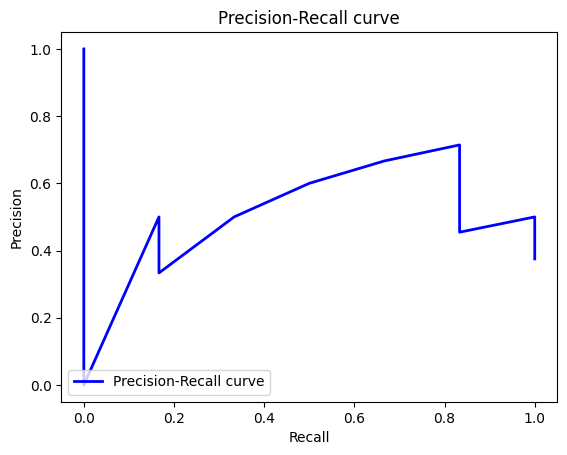

In [ ]:
from sklearn.metrics import precision_recall_curve

# Compute Precision-Recall curve
precision, recall, _ = precision_recall_curve(y_test[:, 1], predictions[:, 1])

# Plot Precision-Recall curve
plt.figure()
plt.plot(recall, precision, color='b', lw=lw, label='Precision-Recall curve')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall curve')
plt.legend(loc="lower left")
plt.show()


In [ ]:
import matplotlib.pyplot as plt

# Assuming y_pred contains the predicted probabilities or labels
# Assuming y_true contains the true labels

# Convert probabilities to binary predictions
y_pred_binary = (y_pred > 0.5).astype(int)

# Plot true labels
plt.scatter(range(len(y_true)), y_true, color='blue', label='True Labels')

# Plot predicted labels
plt.scatter(range(len(y_pred_binary)), y_pred_binary, color='red', label='Predicted Labels')

plt.xlabel('Sample Index')
plt.ylabel('Class')
plt.title('True vs. Predicted Labels')
plt.legend()
plt.show()


NameError: name 'y_true' is not defined